In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta

# **Data processing**

In [2]:
transaction = pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Transactions')
transaction

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,Rank,%cash back
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,NaN,NaN,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,NaN,NaN,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,NaN,NaN,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,NaN,NaN,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,NaN,NaN,NaN
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,NaN,NaN,NaN
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,NaN,NaN,NaN
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,NaN,NaN,NaN


In [3]:
transaction=transaction.iloc[:,:-3]
transaction

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs
...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data


In [4]:
loyalty_points= pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Loyalty Points')
loyalty_points

,Service Group,Point Mechanism,Maximum Point Per Trans
0,supermarket,1 points/1000VND GMV,500 points
1,data,10 points/1000VND GMV,1000 points
2,cvs,1 points/1000VND GMV,300 points
3,marketplace,1 points/1000VND GMV,500 points
4,Coffee chains and Milk tea,1 points/1000VND GMV,500 points
5,Offline Beverage,1 points/1000VND GMV,300 points


In [5]:
merchant=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case//2022 Case challenge_ DA update.xlsx', sheet_name='Data.Merchant')
merchant

,ServiceID,Service Group,Merchant,MerchantID
0,7eleven,cvs,7eleven,1
1,MOMOIOQC20191008,cvs,7eleven,1
2,opcaeon,supermarket,Aeon Mall,2
3,MOMOGPCQ20190613,supermarket,Aeon Mall,2
4,MOMOONXG20191120,supermarket,Aeon Mall,2
...,...,...,...,...
213,buycard_data_vinaphone,data,Vinaphone,43
214,gift_buycard_data_vinaphone,data,Vinaphone,43
215,topup_data_vina,data,Vinaphone,43
216,waynescoffee,Coffee chains and Milk tea,Waynes Coffee,44


In [6]:
benefit=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Loyalty benefits')
benefit

,Class ID,Group,%cashback
0,2,cvs,5
1,2,Offline Beverage,5
2,2,data,5
3,3,cvs,7
4,3,Offline Beverage,7
5,3,data,7
6,3,marketplace,2
7,3,supermarket,2
8,4,cvs,12
9,4,Offline Beverage,12


In [7]:
rank=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case//2022 Case challenge_ DA update.xlsx', sheet_name='Rank')
rank

,Class ID,Rank_name
0,1,STANDARD
1,2,SILVER
2,3,GOLD
3,4,DIAMOND


In [8]:
merchant_info = pd.merge(merchant,loyalty_points,on='Service Group',how='left')
merchant_info

,ServiceID,Service Group,Merchant,MerchantID,Point Mechanism,Maximum Point Per Trans
0,7eleven,cvs,7eleven,1,1 points/1000VND GMV,300 points
1,MOMOIOQC20191008,cvs,7eleven,1,1 points/1000VND GMV,300 points
2,opcaeon,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points
3,MOMOGPCQ20190613,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points
4,MOMOONXG20191120,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points
...,...,...,...,...,...,...
213,buycard_data_vinaphone,data,Vinaphone,43,10 points/1000VND GMV,1000 points
214,gift_buycard_data_vinaphone,data,Vinaphone,43,10 points/1000VND GMV,1000 points
215,topup_data_vina,data,Vinaphone,43,10 points/1000VND GMV,1000 points
216,waynescoffee,Coffee chains and Milk tea,Waynes Coffee,44,1 points/1000VND GMV,500 points


In [9]:
loyalty_points['Service Group']
loyalty_points[['MaxPoint','pt']] =loyalty_points['Maximum Point Per Trans'].str.split(' ',expand =True,n=1)
loyalty_points

,Service Group,Point Mechanism,Maximum Point Per Trans,MaxPoint,pt
0,supermarket,1 points/1000VND GMV,500 points,500,points
1,data,10 points/1000VND GMV,1000 points,1000,points
2,cvs,1 points/1000VND GMV,300 points,300,points
3,marketplace,1 points/1000VND GMV,500 points,500,points
4,Coffee chains and Milk tea,1 points/1000VND GMV,500 points,500,points
5,Offline Beverage,1 points/1000VND GMV,300 points,300,points


**Combined with the 'Loyalty Points' table, add a column 'Loyalty Points' in 'Transactions' table with given rules. Then create another table named 'Loyalty Ranking' which must includes columns named Rank_name and Calculated_points to calculate the Rank of each user on daily basic.**

In [10]:
loyalty_points['MaxPoint']= loyalty_points['MaxPoint'].astype(int)
loyalty_points.dtypes

Service Group              object
Point Mechanism            object
Maximum Point Per Trans    object
MaxPoint                    int32
pt                         object
dtype: object

In [11]:
import numpy as np

condition_data = transaction['Service Group'] == 'data'


transaction.loc[condition_data, 'Loyalty points'] = transaction.loc[condition_data, 'GMV'] / 100
transaction.loc[~condition_data, 'Loyalty points'] = transaction.loc[~condition_data, 'GMV'] / 1000

transaction

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0
...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0


In [12]:
for a,b in  zip(loyalty_points['Service Group'],loyalty_points['MaxPoint']):
      condition = transaction['Service Group'] == a
      transaction.loc[condition,'Loyalty points'] =transaction.loc[condition,'Loyalty points'].apply(lambda x:x if x <= b else b)



In [13]:
transaction

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0
...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0


**At the end of Mar 2022, how many user achived rank Gold?**
**Note: Points calculated for each transaction will be expired after 30 days since the day that transaction is made**

In [14]:
endofMar=transaction[(transaction['DATE']>'2022-03-01')&(transaction['DATE']<'2022-04-01')]
endofMar

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points
42637,2022-03-02,21549087636,Supermarket,25,45715492,55000,supermarket,55.0
42638,2022-03-02,21558157954,Supermarket,25,44080459,203600,supermarket,203.6
42639,2022-03-02,21545970988,Supermarket,25,37381541,526400,supermarket,500.0
42640,2022-03-02,21557916934,Supermarket,25,44080459,25000,supermarket,25.0
42641,2022-03-02,21562502367,CVS,28,47025182,36000,cvs,36.0
...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0


In [15]:
endofMar =endofMar[['User_id','GMV','Loyalty points']]
endofMar = endofMar.groupby('User_id').sum()
endofMar

,GMV,Loyalty points
User_id,,
162483,79000,79.0
298202,48000,48.0
321062,627000,627.0
414676,62000,620.0
422520,84000,840.0
...,...,...
61260552,85000,850.0
61281293,156500,1565.0
61347721,2000,2.0


In [16]:
endofMar['Rank']=endofMar['Loyalty points'].apply(lambda x: 'STANDARD' if x<=999 else('SILVER'if x<=1999 else('GOLD'if x<=4999 else ('DIAMOND'))))
endofMar

,GMV,Loyalty points,Rank
User_id,,,
162483,79000,79.0,STANDARD
298202,48000,48.0,STANDARD
321062,627000,627.0,STANDARD
414676,62000,620.0,STANDARD
422520,84000,840.0,STANDARD
...,...,...,...
61260552,85000,850.0,STANDARD
61281293,156500,1565.0,SILVER
61347721,2000,2.0,STANDARD


In [17]:
count = endofMar['Rank']
count.value_counts()

Rank
STANDARD    1490
SILVER       294
GOLD         123
DIAMOND       14
Name: count, dtype: int64

**Total cashback cost in February 2022**

In [18]:
benefit_info = pd.merge(benefit,rank,on='Class ID',how='left')
benefit_info=benefit_info.rename(columns={'Rank_name':'Rank','Group':'Service Group'})
benefit_info

,Class ID,Service Group,%cashback,Rank
0,2,cvs,5,SILVER
1,2,Offline Beverage,5,SILVER
2,2,data,5,SILVER
3,3,cvs,7,GOLD
4,3,Offline Beverage,7,GOLD
5,3,data,7,GOLD
6,3,marketplace,2,GOLD
7,3,supermarket,2,GOLD
8,4,cvs,12,DIAMOND
9,4,Offline Beverage,12,DIAMOND


In [19]:
def calculate_loyalty_point(user, date):
  user_transactions = transaction[transaction['User_id'] == user]
  upper_filter = user_transactions['DATE'] <= date
  lower_filter = user_transactions['DATE'] >= (date - timedelta(days=30))
  within_30d_transactions = user_transactions[upper_filter & lower_filter]
  accumulated_loyalty_points = within_30d_transactions['Loyalty points'].sum() 
  return accumulated_loyalty_points   

In [20]:
transaction['30 days accumulated loyalty points'] = transaction.apply(lambda row: calculate_loyalty_point(row['User_id'],row['DATE']), axis=1)

In [21]:
transaction['Rank']=transaction['30 days accumulated loyalty points'].apply(lambda x:'STANDARD' if x<=999 else('SILVER'if x<=1999 else('GOLD'if x<=4999 else ('DIAMOND'))))
transaction


,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD
...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD


In [22]:
rank=rank.rename(columns={'Rank_name':'Rank'})
rank

,Class ID,Rank
0,1,STANDARD
1,2,SILVER
2,3,GOLD
3,4,DIAMOND


In [23]:
transactions=pd.merge(transaction,rank,on='Rank',how='left')
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1
...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1


In [24]:
transactions=pd.merge(transactions,benefit_info,on=['Rank','Service Group'],how='left')
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID_x,Class ID_y,%cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,NaN,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,NaN,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,NaN,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,NaN,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,NaN,NaN
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,2.0,5.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,NaN,NaN
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,NaN,NaN


In [25]:
transactions=transactions.drop(columns='Class ID_y')
transactions=transactions.rename(columns={'Class ID_x':'Class ID'})
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,NaN
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,NaN
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,NaN


In [26]:
transactions['%cashback'].fillna(0,inplace=True)

In [27]:
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,0.0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,0.0
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,0.0


In [28]:
transactions['cashback']=transactions['GMV']*(transactions['%cashback']/100)
transactions.dtypes


DATE                                  datetime64[ns]
Order_id                                       int64
NEWVERTICAL_Merchant                          object
MerchantID                                     int64
User_id                                        int64
GMV                                            int64
Service Group                                 object
Loyalty points                               float64
30 days accumulated loyalty points           float64
Rank                                          object
Class ID                                       int64
%cashback                                    float64
cashback                                     float64
dtype: object

In [29]:
transactions['cashback']=transactions['cashback'].apply(lambda x:x if x <10000 else 10000)
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0,0.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0,0.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0,0.0
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0,0.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,0.0,0.0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0,500.0
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,0.0,0.0
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,0.0,0.0


In [30]:
feb =transactions[(transactions['DATE']>='2022-02-01')&(transaction['DATE']<'2022-03-01')]
feb

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback
36987,2022-02-01,20510379115,Airtime,30,32983630,14000,data,140.0,590.0,STANDARD,1,0.0,0.0
36988,2022-02-01,20514342785,Airtime,30,3560552,10000,data,100.0,1564.0,SILVER,2,5.0,500.0
36989,2022-02-01,20502357355,Airtime,30,52261329,28000,data,280.0,480.0,STANDARD,1,0.0,0.0
36990,2022-02-01,20514894447,Airtime,30,45221505,20000,data,200.0,250.0,STANDARD,1,0.0,0.0
36991,2022-02-01,20498110250,Airtime,30,32983630,5000,data,50.0,590.0,STANDARD,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
42461,2022-02-28,21470152866,Airtime,41,47836168,15000,data,150.0,3200.0,GOLD,3,7.0,1050.0
42462,2022-02-28,21480593166,Airtime,41,48347141,15000,data,150.0,150.0,STANDARD,1,0.0,0.0
42463,2022-02-28,21493381211,Airtime,41,60420174,25000,data,250.0,970.0,STANDARD,1,0.0,0.0
42464,2022-02-28,21481080145,Airtime,30,17938338,10000,data,100.0,133.0,STANDARD,1,0.0,0.0


In [31]:
feb['cashback'].sum()

4668841.74

The total cost of cashback in February is 4668841.74

**Design a weekly retention charts of since the program was lauched to monitor**

In [32]:
def weekly_retention (user,date):
    user_transaction = transactions[transactions['User_id']==user]
    upper_filter = transactions['DATE'] < date
    lower_filter = transactions['DATE'] >= (date-timedelta(days=8))
    within_7days = user_transaction[upper_filter&lower_filter]
    if len(within_7days)<1:
        return 0 
    else:
        return 1

In [33]:
transactions['weekly rentention']=transactions.apply(lambda row: weekly_retention(row['User_id'],row['DATE']),axis=1)

C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[up

C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_3176\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[up

In [34]:
transactions[transactions['weekly rentention'] == 1]

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention
21,2021-01-02,8752131006,CVS,28,44014594,38000,cvs,38.0,118.000,STANDARD,1,0.0,0.0,1
43,2021-01-03,8756537226,Coffee chains and Milk tea,10,51426221,59000,Coffee chains and Milk tea,59.0,409.000,STANDARD,1,0.0,0.0,1
44,2021-01-03,8756126920,Coffee chains and Milk tea,10,51426221,54000,Coffee chains and Milk tea,54.0,409.000,STANDARD,1,0.0,0.0,1
45,2021-01-03,8755034104,Coffee chains and Milk tea,10,51426221,55000,Coffee chains and Milk tea,55.0,409.000,STANDARD,1,0.0,0.0,1
48,2021-01-03,8759351785,Airtime,41,61386143,10000,data,100.0,200.000,STANDARD,1,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52752,2022-03-31,22528857348,Airtime,41,47700373,10000,data,100.0,1081.798,SILVER,2,5.0,500.0,1
52753,2022-03-31,22555262725,Airtime,41,39853128,30000,data,300.0,1010.000,SILVER,2,5.0,1500.0,1
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.000,SILVER,2,5.0,500.0,1
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.000,STANDARD,1,0.0,0.0,1


In [35]:
rentention = transactions[['DATE','weekly rentention']]
rentention = rentention.groupby('DATE').sum()
rentention=rentention.reset_index()
rentention

,DATE,weekly rentention
0,2021-01-01,0
1,2021-01-02,1
2,2021-01-03,4
3,2021-01-04,5
4,2021-01-05,4
...,...,...
449,2022-03-27,271
450,2022-03-28,217
451,2022-03-29,317
452,2022-03-30,197


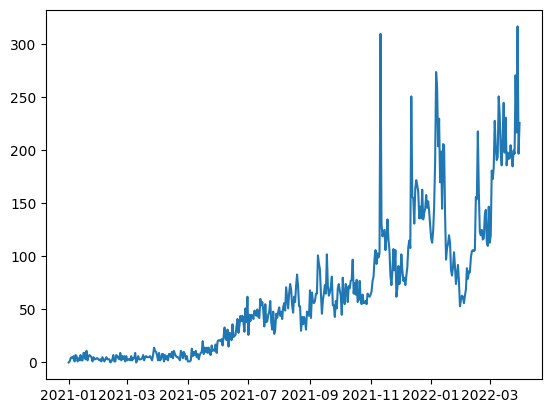

In [36]:
plt.plot(rentention['DATE'],rentention['weekly rentention'],label='Line Chart')

# **Analyze and comment**

# **Question 1**

**User retention and transaction behavior (Is there any trend?) since Loyalty program launched.**

In [37]:
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0,0.0,0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0,0.0,0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0,0.0,0
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0,0.0,0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,0.0,0.0,0
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0,500.0,1
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,0.0,0.0,1
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,0.0,0.0,1


In [38]:
daily_transactions = transactions.groupby('DATE')['Order_id'].count().reset_index()
daily_transactions

,DATE,Order_id
0,2021-01-01,17
1,2021-01-02,20
2,2021-01-03,13
3,2021-01-04,16
4,2021-01-05,15
...,...,...
449,2022-03-27,498
450,2022-03-28,422
451,2022-03-29,493
452,2022-03-30,392


(array([18628., 18687., 18748., 18809., 18871., 18932., 18993., 19052.]),
 [Text(18628.0, 0, '2021-01'),
  Text(18687.0, 0, '2021-03'),
  Text(18748.0, 0, '2021-05'),
  Text(18809.0, 0, '2021-07'),
  Text(18871.0, 0, '2021-09'),
  Text(18932.0, 0, '2021-11'),
  Text(18993.0, 0, '2022-01'),
  Text(19052.0, 0, '2022-03')])

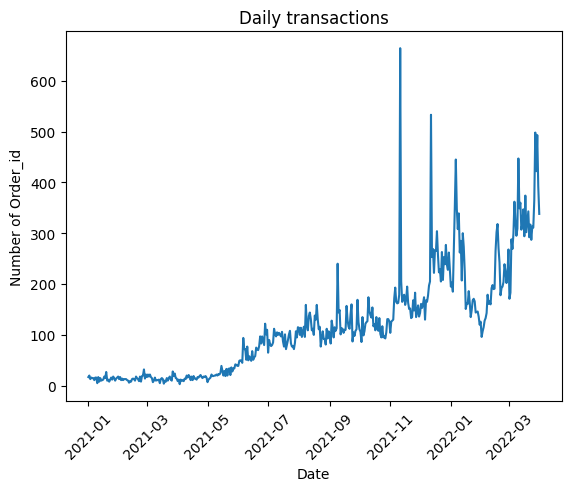

In [39]:
plt.plot(daily_transactions['DATE'],daily_transactions['Order_id'])
plt.title('Daily transactions')
plt.ylabel('Number of Order_id')
plt.xlabel('Date')
plt.xticks(rotation=45)


In [40]:
transactions['Days of week']=transactions['DATE'].dt.day_name()
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention,Days of week
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0,0.0,0,Friday
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0,0.0,0,Friday
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0,0.0,0,Friday
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0,0.0,0,Friday
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0,0.0,0,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,0.0,0.0,0,Thursday
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0,500.0,1,Thursday
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,0.0,0.0,1,Thursday
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,0.0,0.0,1,Thursday


In [41]:
daysofweek = transactions.groupby('Days of week')['Order_id'].count().reset_index()
daysofweek

,Days of week,Order_id
0,Friday,7101
1,Monday,7181
2,Saturday,7323
3,Sunday,7729
4,Thursday,8728
5,Tuesday,7353
6,Wednesday,7345


([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Friday'),
  Text(1, 0, 'Monday'),
  Text(2, 0, 'Saturday'),
  Text(3, 0, 'Sunday'),
  Text(4, 0, 'Thursday'),
  Text(5, 0, 'Tuesday'),
  Text(6, 0, 'Wednesday')])

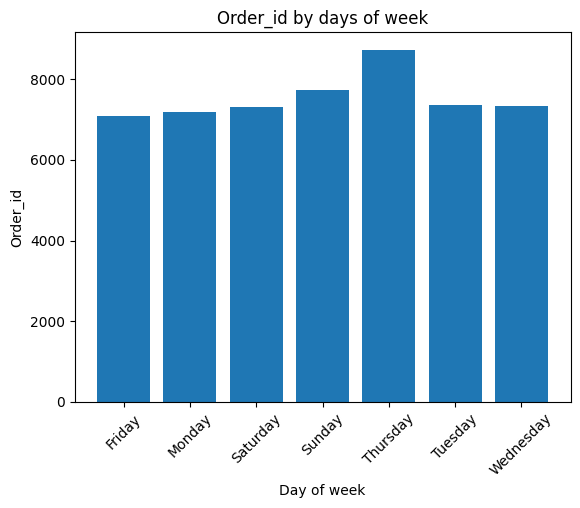

In [42]:
plt.bar(daysofweek['Days of week'],daysofweek['Order_id'])
plt.title('Order_id by days of week')
plt.xlabel('Day of week')
plt.ylabel('Order_id')
plt.xticks(rotation=45)

In [43]:
daysofweek_ = transactions.groupby('Days of week')['weekly rentention'].sum().reset_index()

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Friday'),
  Text(1, 0, 'Monday'),
  Text(2, 0, 'Saturday'),
  Text(3, 0, 'Sunday'),
  Text(4, 0, 'Thursday'),
  Text(5, 0, 'Tuesday'),
  Text(6, 0, 'Wednesday')])

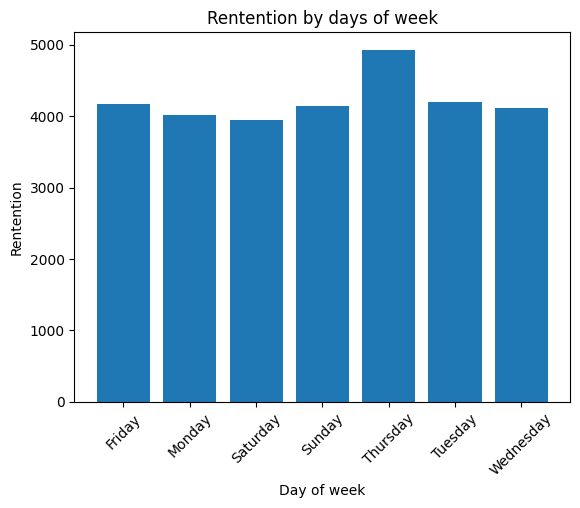

In [44]:
plt.bar(daysofweek_['Days of week'],daysofweek_['weekly rentention'])
plt.title('Rentention by days of week')
plt.xlabel('Day of week')
plt.ylabel('Rentention')
plt.xticks(rotation=45)

The company has seen a notable boost in orders since applying for the loyalty program. The number of orders peaked at about 600 orders in November 2022. Following that, the trend of orders increased, with the total amount placed being around twice as high as it was before. Moreover, the highest transaction and retention rates occur on Thursdays.

# **Question 2**

**Momo is facing increasing amount of cashback cost as well as  GMV since launched. However, we want to optimize the cost but still want to keep growth of GMV and increase the retention rate.**

In [45]:
service= transactions.groupby('Service Group').agg({'GMV':'sum','cashback':'sum'}).reset_index()
service=service.set_index('Service Group')
service

,GMV,cashback
Service Group,,
Coffee chains and Milk tea,154917495,0.00
Offline Beverage,1883000,39550.00
cvs,1882831446,17810535.49
data,353137800,10056645.00
marketplace,3925019072,23505543.92
supermarket,1243618881,6988237.40


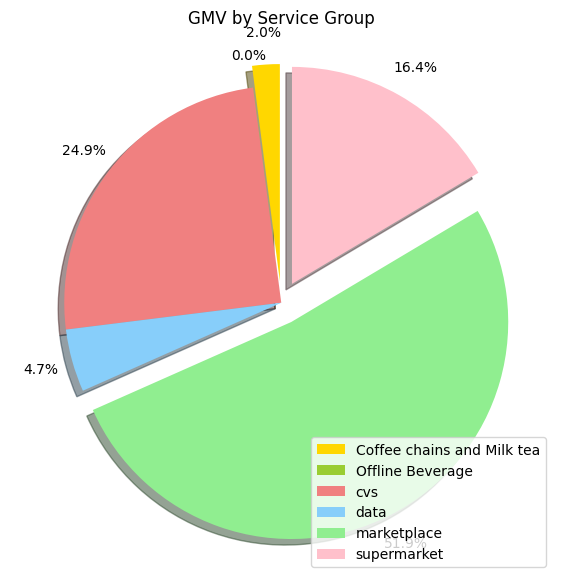

In [46]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink']
explode_list = [0.1, 0, 0, 0, 0.1, 0.1] 

plt.figure(figsize=(7,10))  # Set the figure size here

plt.pie(service['GMV'], labels=None, autopct='%1.1f%%', startangle=90, shadow=True, pctdistance=1.15,
        colors=colors_list,
        explode=explode_list)

plt.title('GMV by Service Group')
plt.legend(labels=service.index, loc='lower right')

plt.show()



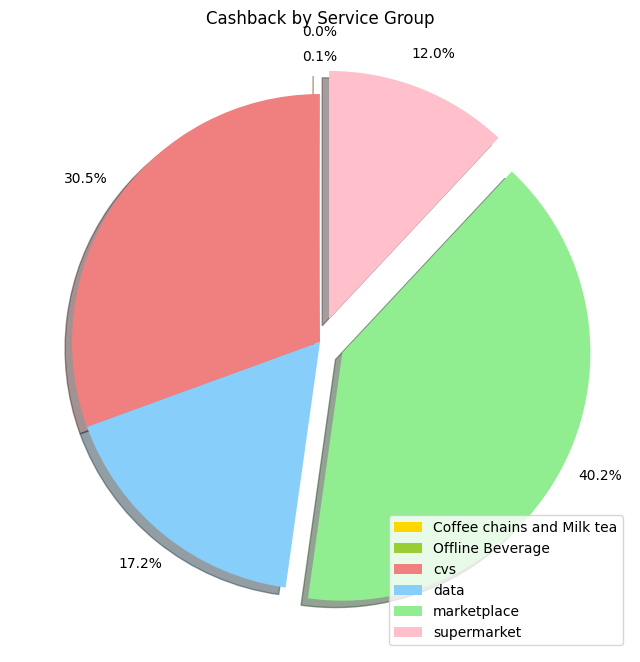

In [47]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink']
explode_list = [0.1, 0, 0, 0, 0.1, 0.1] 

plt.figure(figsize=(8,10))  # Set the figure size here

plt.pie(service['cashback'], labels=None, autopct='%1.1f%%', startangle=90, shadow=True, pctdistance=1.15,
        colors=colors_list,
        explode=explode_list)

plt.title('Cashback by Service Group')
plt.legend(labels=service.index, loc='lower right')

# Display the plot
plt.show()


In [48]:
transactions

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention,Days of week
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0,0.0,0,Friday
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0,0.0,0,Friday
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0,0.0,0,Friday
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0,0.0,0,Friday
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0,0.0,0,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52755,2022-03-31,22531432792,Airtime,41,53272777,30000,data,300.0,760.0,STANDARD,1,0.0,0.0,0,Thursday
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.0,SILVER,2,5.0,500.0,1,Thursday
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.0,STANDARD,1,0.0,0.0,1,Thursday
52758,2022-03-31,22518047037,Airtime,30,29029358,5000,data,50.0,600.0,STANDARD,1,0.0,0.0,1,Thursday


In [70]:
distinct_count = transactions['Order_id'].nunique()
distinct_count

49175

In [69]:
total = transactions.groupby(['Service Group','Class ID']).agg({'GMV':'sum','cashback':'sum','Order_id':'nunique'})
total['Ratio']=total['cashback']/total['GMV']
total

GMV     cashback  Order_id  \
Service Group              Class ID                                      
Coffee chains and Milk tea 1          100507797         0.00      1495   
                           2           27495541         0.00       301   
                           3           19412384         0.00       235   
                           4            7501773         0.00        81   
Offline Beverage           1            1092000         0.00        19   
                           2             791000     39550.00        14   
cvs                        1          882132952         0.00      6847   
                           2          364966305   6994776.55      1759   
                           3          412314947   6457499.42      1251   
                           4          223417242   4358259.52       478   
data                       1          187249100         0.00     11307   
                           2           93582200   4671360.00      2869   
                           3           60153500   4131245.00      1655   
                           4           12153000   1254040.00       259   
marketplace                1         1520711960         0.00      9709   
                           2          990211416         0.00      2867   
                           3          738627008  11220646.02      2100   
                           4          675468688  12284897.90      1202   
supermarket                1          538182798         0.00      2701   
                           2          329293045         0.00      1002   
                           3          228023150   3418330.70       607   
                           4          148119888   3569906.70       417   

                                        Ratio  
Service Group              Class ID            
Coffee chains and Milk tea 1         0.000000  
                           2         0.000000  
                           3         0.000000  
                           4         0.000000  
Offline Beverage           1         0.000000  
                           2         0.050000  
cvs                        1         0.000000  
                           2         0.019166  
                           3         0.015662  
                           4         0.019507  
data                       1         0.000000  
                           2         0.049917  
                           3         0.068678  
                           4         0.103188  
marketplace                1         0.000000  
                           2         0.000000  
                           3         0.015191  
                           4         0.018187  
supermarket                1         0.000000  
                           2         0.000000  
                           3         0.014991  
                           4         0.024101

# **Question 3**

**Gamification is usually a sensible option for apps to raise users’ stickiness. In our loyalty program development strategy, we also plan to hold a small game for users. The rule is simple: any users who can maintain a 20-day or longer streak of being in the DIAMOND ranking is a winner (in other words, winners are users who have total loyalty points greater than or equal to 5,000 for at least 20 consecutive days). We also want to give a special reward for the user(s) who can maintain the longest streak. Could you help us to calculate how many winners were there during the last thirty days in the given data (March 01 - March 31) and who was/were the one(s) boasting the longest streak during that time?**

In [85]:
mar = transactions[(transactions['DATE']>'2022-03-01')&(transaction['DATE']<'2022-03-31')&(transactions['Rank']=='DIAMOND')]
mar

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention,Days of week,20streak
42722,2022-03-02,21543303436,Marketplace,24,47662326,3238000,marketplace,500.0,24085.726,DIAMOND,4,5.0,10000.0,1,Wednesday,0
42826,2022-03-03,21579072703,Marketplace,37,57207697,980000,marketplace,500.0,7835.400,DIAMOND,4,5.0,10000.0,1,Thursday,0
42827,2022-03-03,21591742656,Marketplace,37,57207697,288000,marketplace,288.0,7835.400,DIAMOND,4,5.0,10000.0,1,Thursday,0
42829,2022-03-03,21591031164,Marketplace,37,57207697,192000,marketplace,192.0,7835.400,DIAMOND,4,5.0,9600.0,1,Thursday,0
42856,2022-03-03,21591031164,Marketplace,37,57207697,192000,marketplace,192.0,7835.400,DIAMOND,4,5.0,9600.0,1,Thursday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52375,2022-03-30,22488594006,Airtime,41,54788782,90000,data,900.0,5350.000,DIAMOND,4,12.0,10000.0,1,Wednesday,0
52405,2022-03-30,22505613653,Airtime,41,54788782,15000,data,150.0,5350.000,DIAMOND,4,12.0,1800.0,1,Wednesday,0
52408,2022-03-30,22488594180,Airtime,41,54788782,90000,data,900.0,5350.000,DIAMOND,4,12.0,10000.0,1,Wednesday,0
52415,2022-03-30,22512827194,Airtime,41,54788782,15000,data,150.0,5350.000,DIAMOND,4,12.0,1800.0,1,Wednesday,0


In [91]:
distinct_count = mar['User_id'].nunique()
distinct_count

21

In [88]:
df_no_duplicates = mar.drop_duplicates(subset=['DATE', 'User_id']).reset_index(drop=True)
df_no_duplicates

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention,Days of week,20streak
0,2022-03-02,21543303436,Marketplace,24,47662326,3238000,marketplace,500.0,24085.726,DIAMOND,4,5.0,10000.0,1,Wednesday,0
1,2022-03-03,21579072703,Marketplace,37,57207697,980000,marketplace,500.0,7835.400,DIAMOND,4,5.0,10000.0,1,Thursday,0
2,2022-03-03,21588738739,Marketplace,24,47662326,263400,marketplace,263.4,26185.904,DIAMOND,4,5.0,10000.0,1,Thursday,0
3,2022-03-03,21590625942,Marketplace,24,39314846,338100,marketplace,338.1,6910.720,DIAMOND,4,5.0,10000.0,1,Thursday,0
4,2022-03-03,21575028077,CVS,8,55200938,120000,cvs,120.0,6538.154,DIAMOND,4,12.0,10000.0,1,Thursday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137,2022-03-30,22507686183,Marketplace,24,55443594,1315180,marketplace,500.0,9726.500,DIAMOND,4,5.0,10000.0,1,Wednesday,0
138,2022-03-30,22498842732,Marketplace,24,39314846,45500,marketplace,45.5,7872.230,DIAMOND,4,5.0,2275.0,1,Wednesday,0
139,2022-03-30,22491815362,Marketplace,24,44850195,159000,marketplace,159.0,5420.102,DIAMOND,4,5.0,7950.0,1,Wednesday,0
140,2022-03-30,22513934223,Airtime,41,49689927,10000,data,100.0,8700.000,DIAMOND,4,12.0,1200.0,1,Wednesday,0


In [94]:
date_diff = mar.groupby('User_id')['DATE'].agg(lambda x: (x.max() - x.min()).days).reset_index()
date_diff

,User_id,DATE
0,12229364,0
1,25993024,4
2,31244414,0
3,36884902,20
4,39314846,27
5,39619396,6
6,43160536,10
7,43933779,0
8,44119627,0
9,44850195,1


In [96]:
winnerstreak = date_diff[date_diff['DATE']>=20]
winnerstreak

,User_id,DATE
3,36884902,20
4,39314846,27
12,47662326,27
14,50185392,22
15,51432947,25
18,55200938,27
20,57207697,27


In [98]:
sorted= date_diff.sort_values(by='DATE',ascending=False)
sorted.head(5)

,User_id,DATE
20,57207697,27
4,39314846,27
18,55200938,27
12,47662326,27
15,51432947,25
